In [1]:
import numpy as np
import time
from glob import glob
from natsort import natsorted
from skimage.measure import label
from skimage.segmentation import relabel_sequential
import matplotlib.pyplot as plt

from metrics import evaluate 
from utils import *
import cv2, os

In [2]:
meds = ["graphcl", "rec", "maskrcnn"]
len_test = 100

In [3]:
graphcl_path = natsorted (glob ('/home/tuan/GraphCL3D/deploy/224_mnseg2018//test/*.tif')) [:len_test]
rec_path = natsorted (glob ('/home/tuan/rec-attend-public-all/rec-monuseg-224/results/full_model_cvppp-20200820150943/output_valid/30/*.png')) [-len_test:]
maskrcnn_path = natsorted (glob ('/home/tuan/Mask_RCNN/results/monuseg_224/submit_20200830T073244/*.tif')) [:len_test]

gt_path = natsorted (glob ('/home/tuan/Data/MoNuSeg2018/224/test/B/*.tif')) 
em_path = natsorted (glob ('/home/tuan/Data/MoNuSeg2018/224/test/A/*.tif'))

In [4]:
graphcl = [io.imread (pth) for pth in graphcl_path]
rec = [io.imread (pth) for pth in rec_path]
print (rec [0].shape)
rec = [(img [...,0] * (256 ** 2)).astype (np.int32) + img [...,1] * 256 + img [...,2] for img in rec]
rec = [relabel_sequential (img) [0] for img in rec]
maskrcnn = [io.imread (pth) for pth in maskrcnn_path]
em =  [io.imread (pth) for pth in em_path]
gt = [io.imread (pth) for pth in gt_path]

(224, 224, 3)


In [13]:
gt_median_sizes = [np.median(np.unique (img, return_counts=True)[1]) for img in gt]
max_ids = np.max ([len (np.unique (img)) for img in gt])
print (gt_median_sizes)
print ("max id: ", max_ids)
print ("Mean ", np.min (gt_median_sizes))

[375.0, 877.0, 329.0, 814.5, 737.0, 763.0, 101.0, 376.0, 410.5, 810.0, 825.0, 88.0, 767.0, 804.0, 814.0, 82.0, 739.5, 719.0, 613.0, 850.0, 641.0, 96.0, 89.0, 387.0, 773.5, 414.0, 636.0, 574.0, 861.5, 105.0, 378.0, 417.0, 447.5, 325.0, 95.0, 105.0, 836.0, 395.0, 608.0, 819.5, 460.0, 552.0, 892.0, 576.0, 807.0, 507.5, 96.0, 433.5, 105.0, 95.0, 110.0, 749.5, 691.0, 84.0, 628.0, 664.0, 850.0, 587.0, 380.0, 422.0, 418.0, 848.0, 882.0, 435.0, 356.0, 786.0, 85.5, 627.0, 640.5, 396.5, 360.5, 682.0, 366.0, 702.0, 810.0, 333.0, 430.0, 689.5, 851.0, 571.0, 98.0, 794.0, 452.0, 409.0, 850.0, 740.0, 758.5, 558.0, 95.5, 445.0, 327.0, 700.0, 405.0, 454.0, 619.0, 839.5, 407.0, 719.0, 774.0, 433.0]
max id:  247
Mean  82.0


In [5]:
paths = [graphcl_path, rec_path, maskrcnn_path]
res = [graphcl, rec, maskrcnn]

In [6]:
#Post-processing GraphCL
metrics = ["bestDice", "rand_i", "voi_split", "voi_merge", "adapted_rand", "AJI"]
minsize = 10
scores = np.zeros (len (metrics))

post_processed = []
post_proc_time = 0

for i in range (len_test):
    curtime = time.time ()
    pred_lbl = label (graphcl [i])
    gt_lbl = gt [i]
    pred_lbl = relabel_sequential (clean (pred_lbl, minsize)) [0]
    post_processed += [pred_lbl]
    post_proc_time += time.time () - curtime
    
    size = gt_lbl.shape
    pred_lbl = cv2.resize (pred_lbl.astype (np.int32), size, interpolation=cv2.INTER_NEAREST)
    
    scores += np.array (evaluate (pred_lbl, gt_lbl))

avg_post_proc_time = post_proc_time / len_test
scores /= len_test
    
for met, score in zip (metrics, scores):
    print (met, ":\t", score)
print ("Post processing time: ", avg_post_proc_time)

bestDice :	 0.6770160842567499
rand_i :	 0.6359132470659961
voi_split :	 0.672560867310693
voi_merge :	 1.9167271846820515
adapted_rand :	 0.3199968929241441
AJI :	 0.5373387482226183
Post processing time:  0.0018466949462890626


In [7]:
graphcl = post_processed 


In [8]:
tmp = []
for med, met, lbl_lists in zip (meds, metrics, res):
    if med == 'graphcl':
        continue
    scores = np.zeros (len (metrics))
    for i in range (len_test):
        gt_lbl = gt [i]
        pred_lbl = relabel_sequential (lbl_lists [i]) [0]
        size = gt_lbl.shape
        pred_lbl = cv2.resize (pred_lbl.astype (np.int32), size, interpolation=cv2.INTER_NEAREST)
        scores += np.array (evaluate (pred_lbl, gt_lbl))
        lbl_lists [i] = pred_lbl
    tmp += [lbl_lists]
    scores /= len_test
    print (med)
    for met, score in zip (metrics, scores):
        print (met, ":\t", score)
    print ('-' * 60)
rec, maskrcnn = tmp

rec
bestDice :	 0.2571096835520923
rand_i :	 0.18043276758777274
voi_split :	 0.6561883369629815
voi_merge :	 5.029633280599716
adapted_rand :	 0.8269911354567955
AJI :	 0.07201441275155415
------------------------------------------------------------
maskrcnn
bestDice :	 0.46557516547325906
rand_i :	 0.40384984165479004
voi_split :	 0.6868499300516462
voi_merge :	 3.573606760556645
adapted_rand :	 0.6642922398246424
AJI :	 0.3331169361328952
------------------------------------------------------------


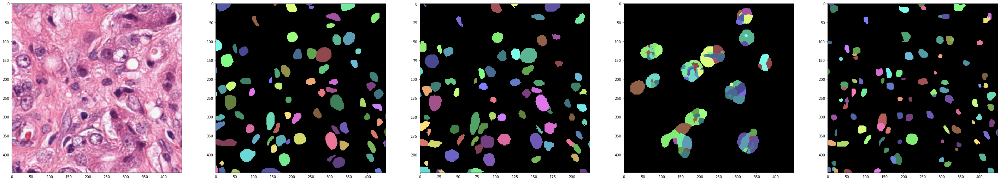

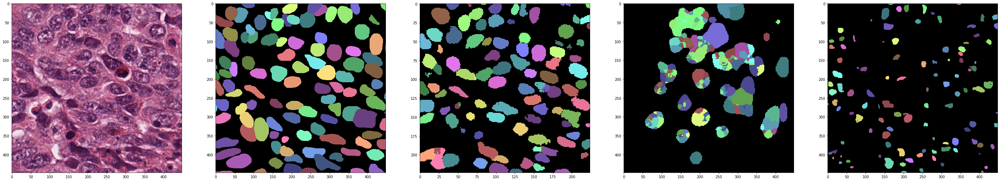

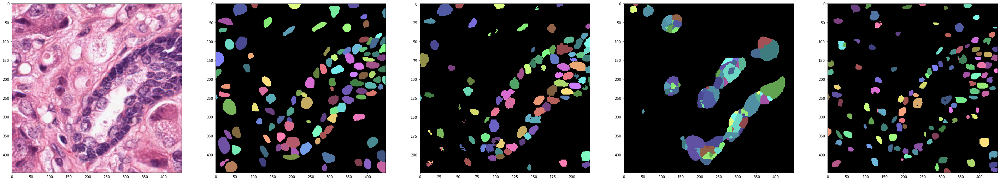

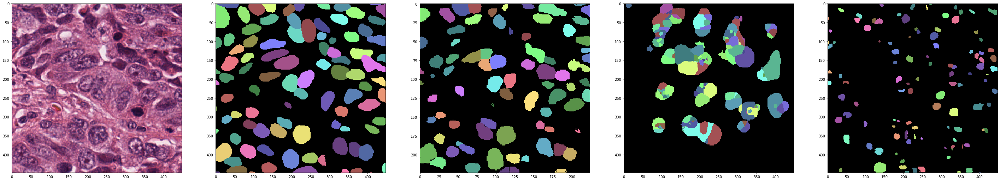

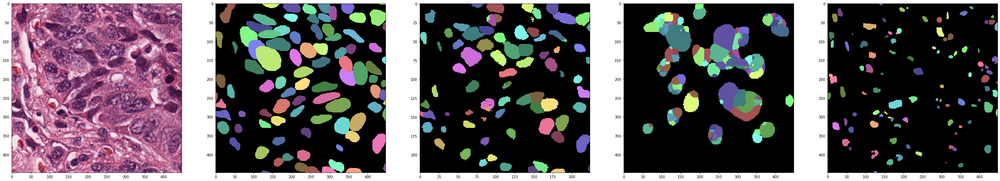

...

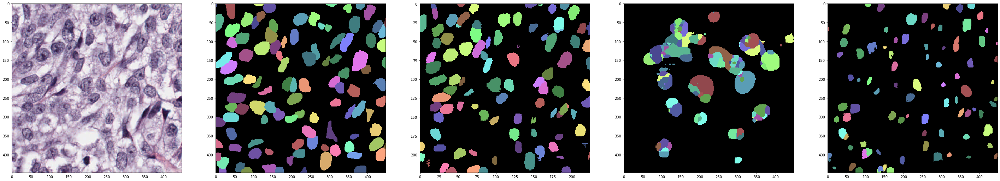

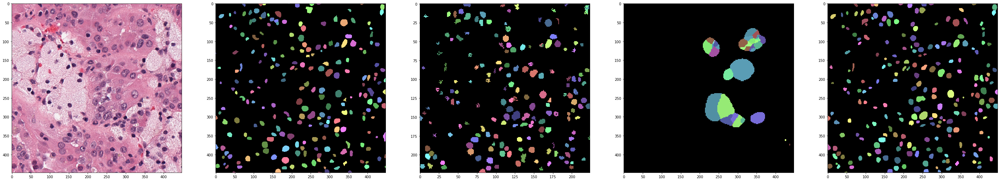

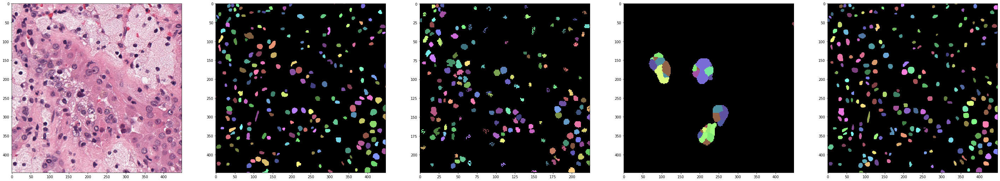

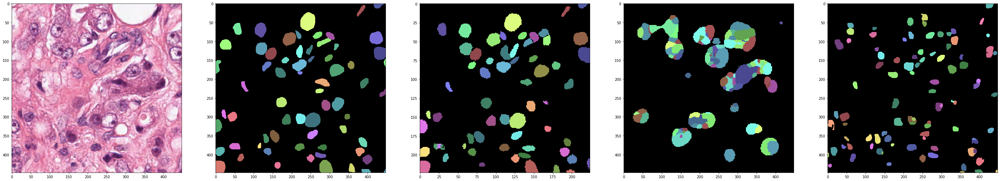

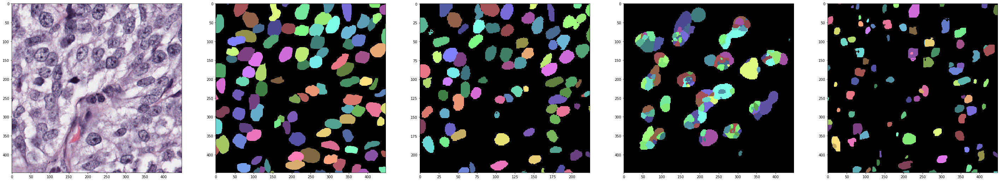

In [18]:
lbl2rgb = color_generator (300)
for idx in range (0, 25):
    fig, ax = plt.subplots (1,5, figsize=(50,15))
    ax [0].imshow (em [idx])
    ax [1].imshow (lbl2rgb (gt [idx]))
    ax [2].imshow (lbl2rgb (post_processed [idx]))
    ax [3].imshow (lbl2rgb (rec [idx]))
    ax [4].imshow (lbl2rgb (maskrcnn[idx]))
    plt.show ()

In [19]:
result_dir = "224_monuseg_results"
rec_path = natsorted (glob ('/home/tuan/rec-attend-public-all/rec-monuseg-224/results/full_model_cvppp-20200820150943/output_valid/30/*.png')) [-len_test:]
print ('test', len (rec_path), len_test)
lbl2rgb = color_generator (300)
res = [graphcl, rec, maskrcnn, gt, em]
meds = ["graphcl", "rec", "maskrcnn", "gt", "em"]
for med, lbl_lists in zip (meds, res):
    med_dir = result_dir + "/" + med + '/'
    os.makedirs (med_dir, exist_ok=True)
    if med in ['rec', 'acis', 'em']:
        continue
    
    for i in range (len_test):
        if (np.max (lbl_lists [i]) >= 300):
            continue
        io.imsave (med_dir + '/' + str (i) + '.png', lbl2rgb (lbl_lists [i]))

os.makedirs (result_dir + "/" + 'em' + '/', exist_ok=True)
for i in range (len_test):
    io.imsave (result_dir + '/em/' + str (i) + '.png', em[i])
    

for i in range (len_test):
    cmd = "cp " + rec_path [i] + ' ' + result_dir + '/rec/' + str (i) + '.png' 
    os.system (cmd)

/opt/conda/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 224_monuseg_results/graphcl//0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 224_monuseg_results/graphcl//1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 224_monuseg_results/graphcl//2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0

test 100 100


/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 224_monuseg_results/graphcl//3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 224_monuseg_results/graphcl//4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 224_monuseg_results/graphcl//5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 224_monuseg_results/graphcl//6.